In [30]:
import matplotlib.pyplot as plt
import pandas as pd 
import numpy as np
import datetime as dt
import pickle

In [2]:
from wordcloud import WordCloud

def plot_wordcloud_from_tweets(preprocessed_tweets):
  text = " ".join(" ".join(tweet) for tweet in preprocessed_tweets)

  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=[], colormap='winter', background_color="black").generate(text)

  # Display the generated image:
  # the matplotlib way:
  plt.figure(figsize=(10,8))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

In [3]:
df = pd.read_csv('reddit_posts_preprocessed_stemmed_2022_04_12-03_12_51_PM.csv')

In [4]:
import re, string, unicodedata
import nltk
import contractions # expanding contractions
import inflect # natural language related tasks of generating plurals, singular nouns, etc.
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer, WordNetLemmatizer
from nltk.tokenize import TweetTokenizer
import string


#nltk.download('punkt')
#nltk.download('stopwords')
#nltk.download('wordnet')

In [5]:
import nltk
#nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')
nltk.download('omw-1.4')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\hayadi\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\hayadi\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [6]:
import sys
sys.path.append("../utils/preprocess")
from preprocess import Preprocess
prep = Preprocess()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hayadi\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hayadi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\hayadi\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [7]:
preprocessed_reddit_posts = df['preprocessed_selftext']
preprocessed_reddit_posts

0                                ['food', 'best', 'toler']
1        ['current', 'month', '7.5', 'lh', 'voyag', 'br...
2        ['someon', 'suggest', 'post', 'alway', 'want',...
3        ['context', 'covid', 'back', 'late', 'juli', '...
4        ['read', 'lot', 'post', 'sub', 'want', 'preten...
                               ...                        
20883    ['topic', 'picki', 'eater', 'convo', 'today', ...
20884    ['year', 'old', 'sinc', 'februari', 'slowli', ...
20885         ['place', 'member', 'longhaulerkid', 'chat']
20886    ['famili', 'partner', 'kid', 'caught', 'covid'...
20887            ['place', 'member', 'covidlonga', 'chat']
Name: preprocessed_selftext, Length: 20888, dtype: object

In [8]:
preprocessed_titled_reddit_posts = df['preprocessed_titled_selftext']
preprocessed_titled_reddit_posts

0                ['safe', 'food', 'food', 'best', 'toler']
1        ['much', 'exercis', 'current', 'month', '7.5',...
2        ['improv', 'quit', 'lot', 'stop', 'post', 'som...
3        ['lose', '18lbs', 'due', 'longcovid', 'start',...
4        ['symptom', 'debilit', 'still', 'suck', 'relat...
                               ...                        
20883    ['dysgeusia', 'child', 'topic', 'picki', 'eate...
20884    ['longhaul', 'child', 'suffer', 'year', 'old',...
20885    ['longhaulerkid', 'loung', 'place', 'member', ...
20886    ['vaccin', 'long', 'hauler', 'kid', 'famili', ...
20887    ['covidlonga', 'loung', 'place', 'member', 'co...
Name: preprocessed_titled_selftext, Length: 20888, dtype: object

In [9]:
import gensim
from gensim.utils import simple_preprocess
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hayadi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [10]:
custom_stop_words = ['covid', 'symptom', 'like', 'feel', 'day', 'month', 'anyone', 'long', 
                     'time', 'week', 'back', 'test', 'start', 'know', 'would', 'think', 'since']

def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) 
             if word not in custom_stop_words] for doc in texts]

data_words = remove_stopwords(preprocessed_reddit_posts)
titled_data_words = remove_stopwords(df['preprocessed_titled_selftext'])

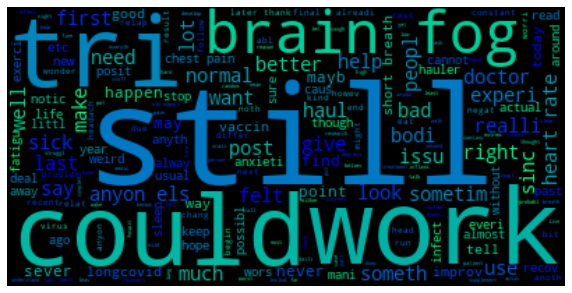

In [11]:
plot_wordcloud_from_tweets(data_words)

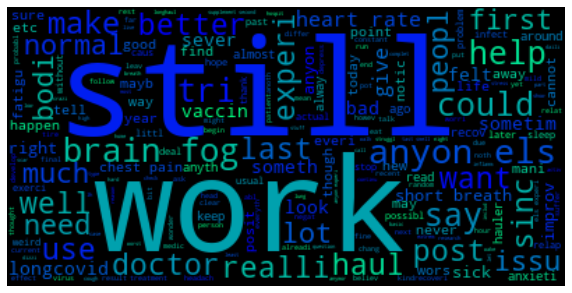

In [12]:
plot_wordcloud_from_tweets(titled_data_words)

In [13]:
# Use list comprehension to convert a list of lists to a flat list 
all_words = [item for elem in data_words for item in elem]
titled_all_words = [item for elem in titled_data_words for item in elem]

In [14]:
from collections import Counter
word_frequencies = Counter(all_words)
len(word_frequencies)

20758

In [15]:
word_frequencies.most_common()

[('anyon', 9278),
 ('pain', 8147),
 ('help', 7595),
 ('still', 6752),
 ('work', 6441),
 ('sinc', 6180),
 ('experi', 5996),
 ('tri', 5876),
 ('heart', 5788),
 ('make', 5767),
 ('realli', 5691),
 ('could', 5673),
 ('doctor', 5633),
 ('issu', 5459),
 ('say', 5388),
 ('brain', 5269),
 ('better', 5239),
 ('breath', 4931),
 ('normal', 4923),
 ('fatigu', 4888),
 ('last', 4772),
 ('els', 4768),
 ('want', 4694),
 ('post', 4588),
 ('much', 4569),
 ('peopl', 4480),
 ('cannot', 4480),
 ('bodi', 4461),
 ('felt', 4413),
 ('year', 4412),
 ('chest', 4303),
 ('first', 4249),
 ('find', 3865),
 ('vaccin', 3836),
 ('bad', 3737),
 ('sleep', 3680),
 ('never', 3593),
 ('blood', 3555),
 ('anxieti', 3552),
 ('fog', 3542),
 ('lot', 3461),
 ('wors', 3446),
 ('someth', 3418),
 ('posit', 3293),
 ('smell', 3292),
 ('anyth', 3228),
 ('haul', 3183),
 ('tell', 3170),
 ('use', 3166),
 ('around', 3112),
 ('sick', 3104),
 ('well', 3096),
 ('infect', 3095),
 ('life', 3068),
 ('ago', 2910),
 ('everi', 2881),
 ('give', 2860

In [16]:
#see that index for assessing topic modeling algorithms or for choosing the value of n (the number of topics to work on) 

## Clustering

In [20]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score

def mbkmeans_clusters(X, k_range, mb):
    """Generate clusters and print Silhouette metrics using MBKmeans

    Args:
        X: Matrix of features.
        k_range: Number of clusters range.
        mb: Size of mini-batches.

    Returns:
        Trained clustering model and labels based on X.
    """
    
    sum_of_squared_distance = []
    silhouette_values = []
    
    for k in k_range:
        km = MiniBatchKMeans(n_clusters=k, batch_size=mb).fit(X)
        sum_of_squared_distance.append(km.inertia_)
        silhouette_values.append(silhouette_score(X, km.labels_))
    
    plt.plot(k_range, sum_of_squared_distance, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Sum of squared distance')
    plt.title('Elbow Method For Optimal clusters')
    plt.show()
    
    plt.plot(k_range, silhouette_values, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette')
    plt.title('Elbow Method For Optimal clusters')
    plt.show()
    
#    return km, km.labels_

In [21]:
def vectorize(list_of_docs, model):
    """Generate vectors for list of documents using a Word Embedding

    Args:
        list_of_docs: List of documents
        model: Gensim's Word Embedding

    Returns:
        List of document vectors
    """
    features = []

    for tokens in list_of_docs:
        zero_vector = np.zeros(model.vector_size)
        vectors = []
        for token in tokens:
            try:
                if token in model.wv:
                    try:
                        vectors.append(model.wv[token])
                    except KeyError:
                        continue
            except Exception as e:
                print(e)
                if token in model:
                    try:
                        vectors.append(model[token])
                    except KeyError:
                        continue
                
        if vectors:
            vectors = np.asarray(vectors)
            avg_vec = vectors.mean(axis=0)
            features.append(avg_vec)
        else:
            features.append(zero_vector)
    return features

### TF-IDF + KMEANS

In [22]:
from sklearn.feature_extraction.text import TfidfVectorizer
# initialize the vectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True, min_df=5, max_df=0.95)
# fit_transform applies TF-IDF to clean texts - we save the array of vectors in X
X = vectorizer.fit_transform(preprocessed_titled_reddit_posts)

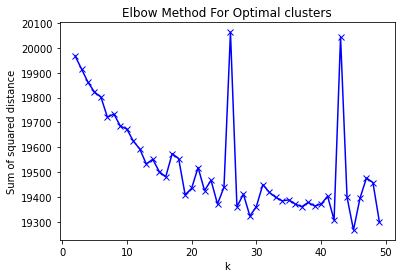

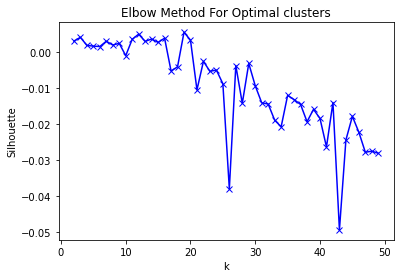

In [25]:
mbkmeans_clusters(
	X=X,
    k_range=range(2,50),
    mb=500,
)

In [72]:
# should test with higher cluster numbers

### Word2vec + KMEANS

#### Custom Word2vec

In [76]:
# the vector size is a hyper parameter you should look into

In [73]:
from gensim.models import Word2Vec

w2v_model = Word2Vec(sentences=preprocessed_titled_reddit_posts, vector_size=100)

In [75]:
import numpy as np

vectorized_docs = vectorize(preprocessed_titled_reddit_posts, model=w2v_model)
len(vectorized_docs), len(vectorized_docs[0])

(20888, 100)

In [77]:
#try the minibatch clustering as it is faster instead

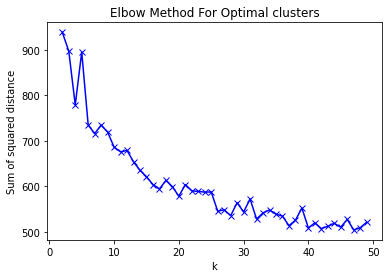

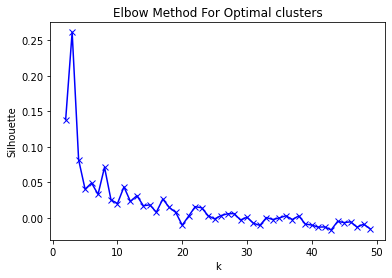

In [83]:
mbkmeans_clusters(
	X=vectorized_docs,
    k_range=range(2,50),
    mb=500,
)

#### Pretrained Word2vec

In [35]:
import gensim.downloader as api

w2v_model_pretrained = api.load('word2vec-google-news-300')

In [36]:
vectorized_docs = vectorize(preprocessed_titled_reddit_posts, model=w2v_model_pretrained)
len(vectorized_docs), len(vectorized_docs[0])

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no att

(20888, 300)

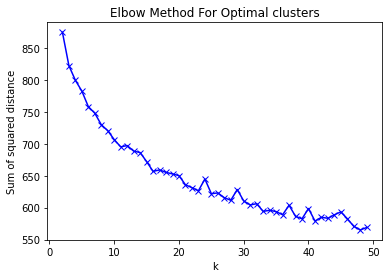

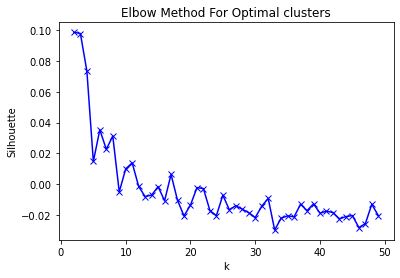

In [37]:
mbkmeans_clusters(
	X=vectorized_docs,
    k_range=range(2,50),
    mb=500,
)

### Gensim FastText + KMEANS

In [38]:
from gensim.models import FastText
ft_model = FastText(vector_size=5, window=3, min_count=1)  # instantiate
ft_model.build_vocab(corpus_iterable=preprocessed_titled_reddit_posts)
ft_model.train(corpus_iterable=preprocessed_titled_reddit_posts, total_examples=len(preprocessed_titled_reddit_posts), epochs=10) 

(23628452, 132020930)

In [39]:
vectorized_docs = vectorize(preprocessed_titled_reddit_posts, model=ft_model)
len(vectorized_docs), len(vectorized_docs[0])

(20888, 5)

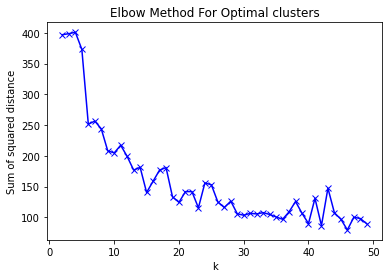

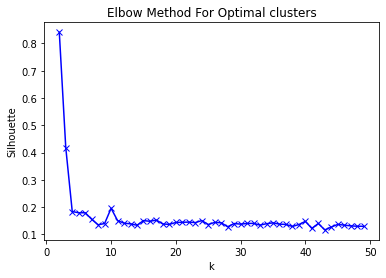

In [40]:
mbkmeans_clusters(
	X=vectorized_docs,
    k_range=range(2,50),
    mb=500,
)

### Gensim FastText + KMEANS

In [ ]:
from gensim.models import Word2Vec
from gensim.models import FastText
from gensim.models import KeyedVectors

wv = KeyedVectors.load('COVID19_300d_vectors.kv')

In [ ]:
wv['symptom']

In [ ]:
wv.most_similar('covid')

In [ ]:
wv.most_similar('pain')

In [ ]:
wv.most_similar('work')

In [29]:
vectorized_docs = vectorize(preprocessed_reddit_posts, model=wv)
len(vectorized_docs), len(vectorized_docs[0])

'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no att

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no att

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no att

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(20888, 300)

In [41]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples


clustering, cluster_labels = mbkmeans_clusters(
	X=vectorized_docs,
    k=3,
    mb=500,
    print_silhouette_values=True,
)

For n_clusters = 3
Silhouette coefficient: 0.07
Inertia:15070.95573023658
Silhouette values:
    Cluster 0: Size:12180 | Avg:0.14 | Min:0.01 | Max: 0.28
    Cluster 2: Size:4389 | Avg:0.01 | Min:-0.07 | Max: 0.19
    Cluster 1: Size:4319 | Avg:-0.08 | Min:-0.21 | Max: 0.07


In [42]:
df_clusters = pd.DataFrame({
    "text": posts_to_process,
    "tokens": [" ".join(text) for text in preprocessed_reddit_posts],
    "cluster": cluster_labels
})

In [43]:
df_clusters

,text,tokens,cluster
0,what foods do you best tolerate?,foods best tolerate,0
1,I'm currently on month 7.5 of my LH voyage. Br...,currently month 7.5 lh voyage breathe issue br...,0
2,"Someone suggested I posted this, which I’ve al...",someone suggest post always want recover bette...,0
3,"For context, I got covid back in late July 202...",context covid back late july two thousand and ...,0
4,I have read a lot of posts on this sub. I don'...,read lot post sub want pretend anywhere near w...,0
...,...,...,...
20883,The topic of a 7 y/o picky eater came up in a ...,topic seven picky eater convo today later real...,2
20884,I have a 7 and 5 year old who since February h...,seven five year old since february slowly deve...,1
20885,A place for members of r/LongHaulerKids to cha...,place member longhaulerkids chat,0
20886,"My family (partner, kid and I) caught Covid in...",family partner kid caught covid march two thou...,0


In [44]:
from sklearn.decomposition import PCA

# initialize PCA with 2 components
pca = PCA(n_components=2, random_state=42)
# pass our X to the pca and store the reduced vectors into pca_vecs
pca_vecs = pca.fit_transform(vectorized_docs)
# save our two dimensions into x0 and x1
x0 = pca_vecs[:, 0]
x1 = pca_vecs[:, 1]

In [45]:
df_clusters['x0'] = x0
df_clusters['x1'] = x1
df_clusters

,text,tokens,cluster,x0,x1
0,what foods do you best tolerate?,foods best tolerate,0,-0.165260,0.010221
1,I'm currently on month 7.5 of my LH voyage. Br...,currently month 7.5 lh voyage breathe issue br...,0,-0.186677,0.030994
2,"Someone suggested I posted this, which I’ve al...",someone suggest post always want recover bette...,0,-0.028097,-0.091953
3,"For context, I got covid back in late July 202...",context covid back late july two thousand and ...,0,-0.016047,0.038874
4,I have read a lot of posts on this sub. I don'...,read lot post sub want pretend anywhere near w...,0,0.112287,-0.060543
...,...,...,...,...,...
20883,The topic of a 7 y/o picky eater came up in a ...,topic seven picky eater convo today later real...,2,0.150490,0.083782
20884,I have a 7 and 5 year old who since February h...,seven five year old since february slowly deve...,1,0.019410,0.222536
20885,A place for members of r/LongHaulerKids to cha...,place member longhaulerkids chat,0,-0.607406,0.115783
20886,"My family (partner, kid and I) caught Covid in...",family partner kid caught covid march two thou...,0,-0.044952,0.006899


In [46]:
# map clusters to appropriate labels 
cluster_map = {0: "cluster_1", 1: "cluster_2"}
# apply mapping
df_clusters['cluster'] = df_clusters['cluster'].map(cluster_map)

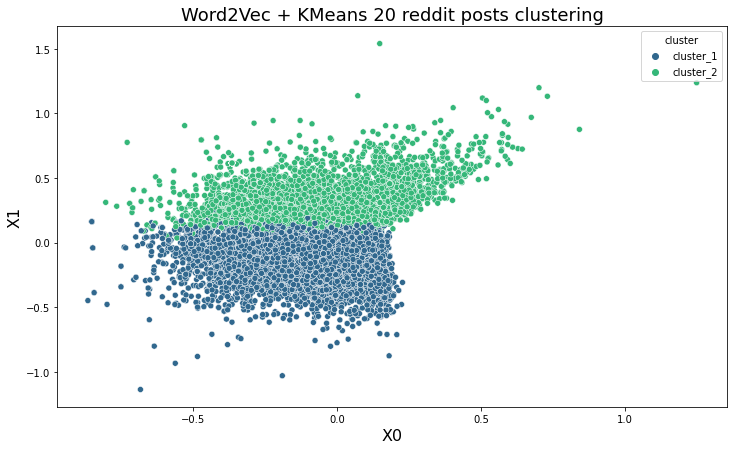

In [47]:
import seaborn as sns 
# set image size
plt.figure(figsize=(12, 7))
# set a title
plt.title("Word2Vec + KMeans 20 reddit posts clustering", fontdict={"fontsize": 18})
# set axes names
plt.xlabel("X0", fontdict={"fontsize": 16})
plt.ylabel("X1", fontdict={"fontsize": 16})
# create scatter plot with seaborn, where hue is the class used to group the data
sns.scatterplot(data=df_clusters, x='x0', y='x1', hue='cluster', palette="viridis")
plt.show()

In [49]:
df_clusters[df_clusters['cluster'] == 'cluster_1']

,text,tokens,cluster,x0,x1
0,what foods do you best tolerate?,foods best tolerate,cluster_1,-0.165260,0.010221
1,I'm currently on month 7.5 of my LH voyage. Br...,currently month 7.5 lh voyage breathe issue br...,cluster_1,-0.186677,0.030994
2,"Someone suggested I posted this, which I’ve al...",someone suggest post always want recover bette...,cluster_1,-0.028097,-0.091953
3,"For context, I got covid back in late July 202...",context covid back late july two thousand and ...,cluster_1,-0.016047,0.038874
4,I have read a lot of posts on this sub. I don'...,read lot post sub want pretend anywhere near w...,cluster_1,0.112287,-0.060543
...,...,...,...,...,...
20877,So around August I was diagnosed with COVID an...,around august diagnose covid week sick recomme...,cluster_1,0.029845,0.021439
20879,"9 month LH , male 23 yrld. All my symptoms are...",nine month lh male twenty-three yrld symptom n...,cluster_1,0.020318,0.015019
20885,A place for members of r/LongHaulerKids to cha...,place member longhaulerkids chat,cluster_1,-0.607406,0.115783
20886,"My family (partner, kid and I) caught Covid in...",family partner kid caught covid march two thou...,cluster_1,-0.044952,0.006899


In [50]:
for _, row in df_clusters[df_clusters['cluster'] == 'cluster_1'].iterrows():
    print(row['tokens'])

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



five month gut gurgle almost day long mostly consume food lay anybody tip rid try probiotic really anything start l-glutamine today bone broth
lower back pain nearly week worse improve either feel stand walk day hurt bend make certain movement rheumatologist week ago say may due atrophy longcovid temporal neuropathy convinced appointment care much either time deal earache week ago well otorhinolaryngology day rheumatologist pain left ear extend left side head start become uncomfortable painful due suspect inflammation diagnose otitis major buildup ear wax give drop ear nasal spray continue treat feel instant relief removal earwax notice least day feel sudden ear pain left ear sometimes right well last long confirmation still deal something someone deal symptom able cure month symptom away newer annoy appointment family doctor next week bring issue
lower back pain nearly week worse improve either feel stand walk day hurt bend make certain movement rheumatologist week ago say may due atr